## Requirements and Imports


In [1]:
import copy
import os
from pathlib import Path
from itertools import combinations
from scipy import stats

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
from torch.utils.data import TensorDataset, DataLoader , WeightedRandomSampler

from sklearn.metrics import roc_auc_score , pairwise_distances
import torch
import torch.optim as optim
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
import scipy.sparse as sp
from numba import jit
import squidpy as sq

In [2]:
import models
import metrics
SMALL_SIZE = 14
MEDIUM_SIZE = 19
BIGGER_SIZE = 20
plt.rcParams["font.family"] = "Verdana"
plt.rc('font', size=BIGGER_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=MEDIUM_SIZE)    # legend fontsize
#plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
sc.set_figure_params(scanpy=True, fontsize=19)


In [3]:
adata = sq.datasets.merfish()
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)
adata

AnnData object with n_obs × n_vars = 73642 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch', 'n_counts'
    uns: 'Cell_class_colors', 'log1p'
    obsm: 'spatial', 'spatial3d'

In [4]:
adata.obs['Cell_class'].value_counts()

Inhibitory       24761
Excitatory       11757
Ambiguous         9269
Astrocyte         8393
OD Mature 2       5736
Endothelial 1     3799
OD Immature 1     2457
Ependymal         1961
Microglia         1472
Endothelial 3     1369
OD Mature 1        952
Pericytes          638
Endothelial 2      581
OD Mature 4        367
OD Immature 2       91
OD Mature 3         39
Name: Cell_class, dtype: int64

findfont: Font family ['Verdana'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Verdana'] not found. Falling back to DejaVu Sans.


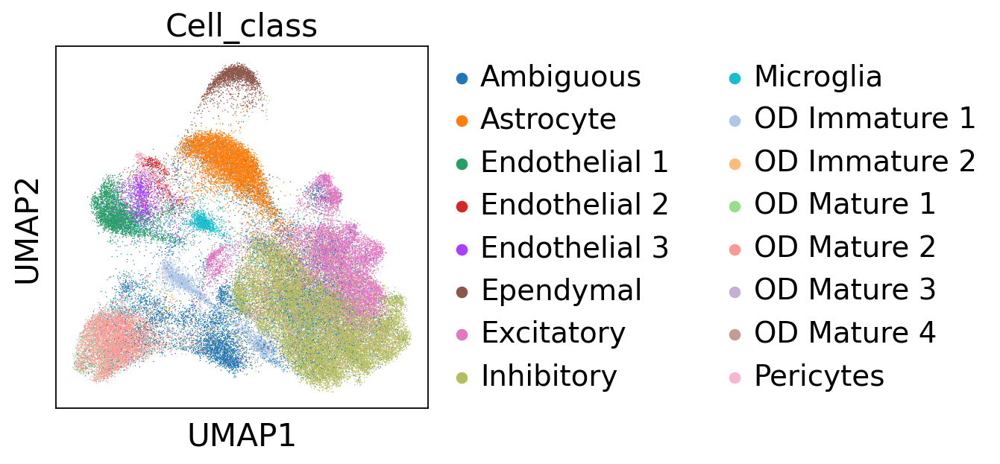

In [5]:
import squidpy as sq
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.pl.umap(adata,color='Cell_class')

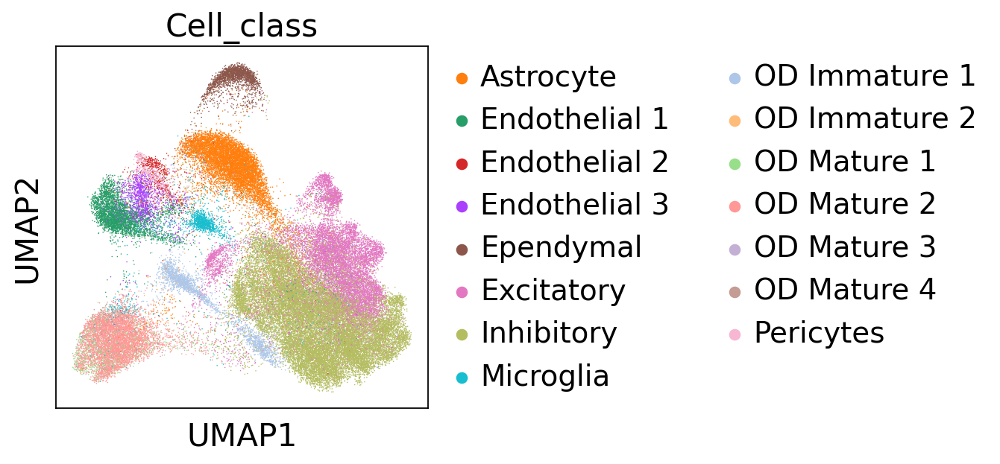

/cs/labs/mornitzan/karinjo/miniconda/envs/rev17/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


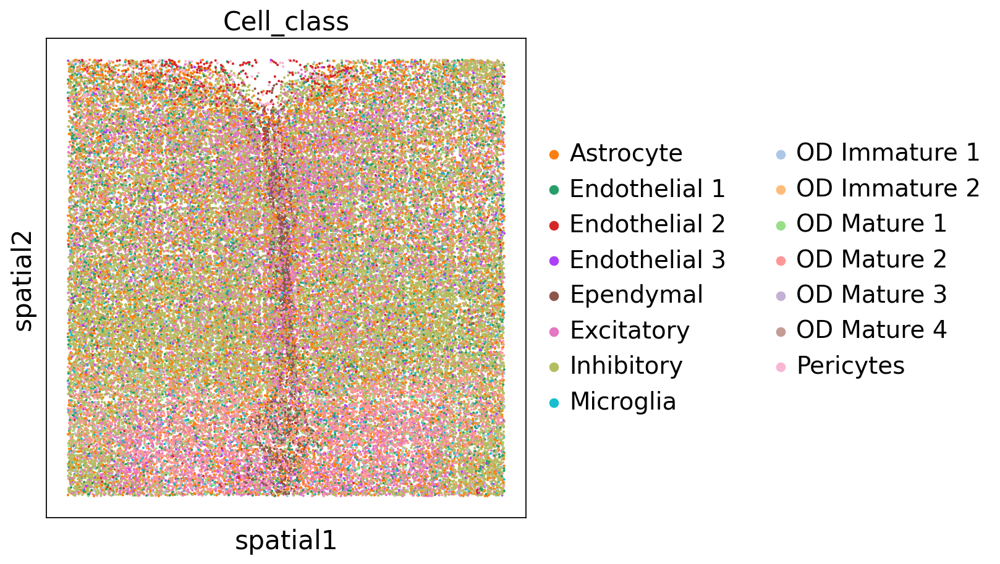

In [6]:
adata= adata[adata.obs['Cell_class'].isin(['OD Mature 2',
 'OD Immature 1',
 'Inhibitory',
 'Excitatory',
 'Microglia',
 'Astrocyte',
 'Endothelial 2',
 'Endothelial 3',
 'Endothelial 1',
 'OD Mature 1',
 'OD Mature 4',
 'Pericytes',
 'OD Mature 3',
 'Ependymal',
 'OD Immature 2']
)]
sc.pl.umap(adata,color='Cell_class')
sq.pl.spatial_scatter(
    adata, color="Cell_class", shape=None, figsize=(10, 10)
)

In [7]:
import numpy as np

# Define a dictionary to map each cluster to its corresponding cell type
cell_type_mapping = {
    'OD Mature 2': 'OD Mature',
    'OD Immature 1': 'OD Immature',
    'Inhibitory': 'Inhibitory',
    'Excitatory': 'Excitatory',
    'Microglia': 'Microglia',
    'Astrocyte': 'Astrocyte',
    'Endothelial 2': 'Endothelial',
    'Endothelial 3': 'Endothelial',
    'Endothelial 1': 'Endothelial',
    'OD Mature 1': 'OD Mature',
    'OD Mature 4': 'OD Mature',
    'Pericytes': 'Pericytes',
    'OD Mature 3': 'OD Mature',
    'Ependymal': 'Ependymal',
    'OD Immature 2': 'OD Immature'
}

# Create an empty list to store the updated cell types
cell_type_list = []

# Iterate over each cluster and assign the corresponding cell type
for i in range(adata.n_obs):
    cluster_name = adata.obs['Cell_class'][i]
    if cluster_name in cell_type_mapping:
        cell_type_list.append(cell_type_mapping[cluster_name])
    else:
        cell_type_list.append(cluster_name)

# Update the cell type column in the AnnData object
adata.obs['CellType'] = np.array(cell_type_list)


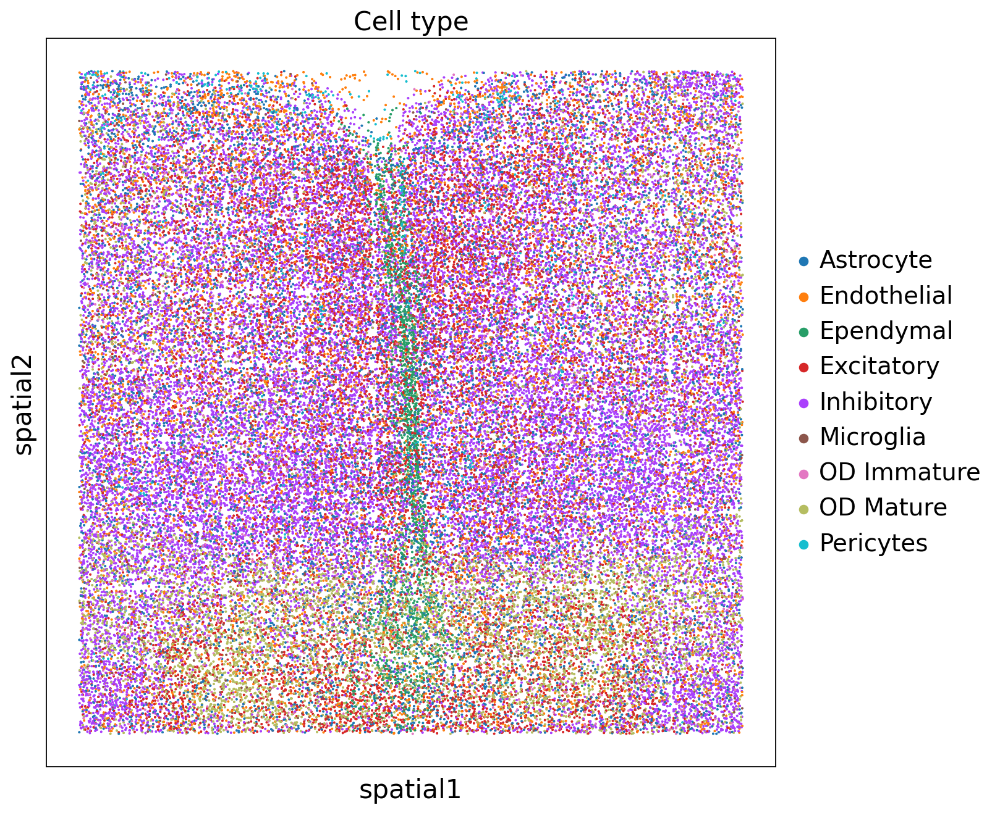

In [8]:
sq.pl.spatial_scatter(
    adata, color="CellType", shape=None, figsize=(10, 10), title='Cell type'
)


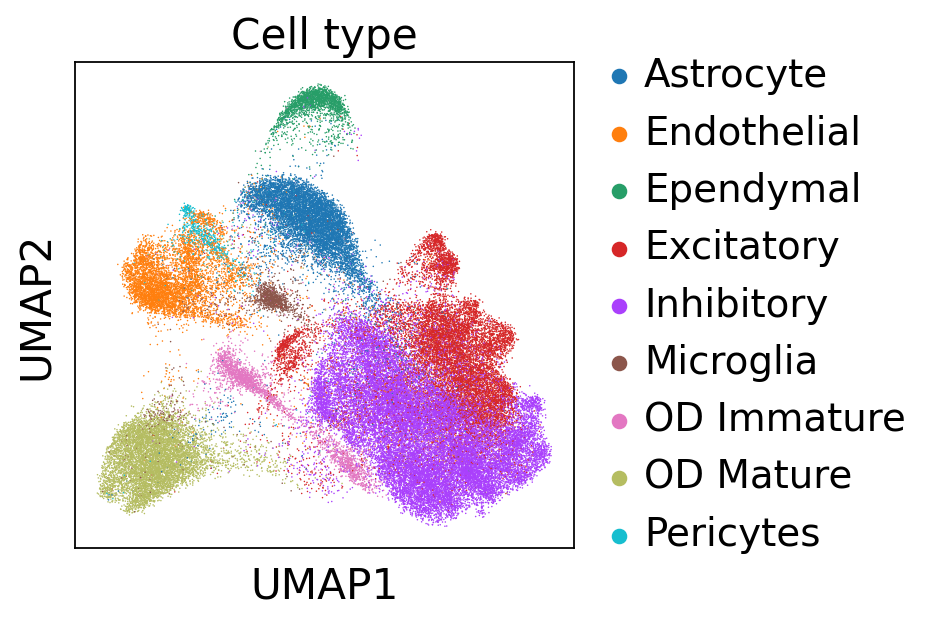

In [9]:
sc.pl.umap(adata,color='CellType', title='Cell type')

In [10]:
len(set(adata.obs['CellType']))

9

In [11]:
adata.obsm['spatial']

array([[0.00906344, 0.08041869],
       [0.03281294, 0.09883481],
       [0.04015782, 0.07502649],
       ...,
       [0.93928628, 0.88763104],
       [0.97045268, 0.88984304],
       [0.99918989, 0.94175804]])

In [12]:
epoch_num=20
prob_list = models.follow_training_dyn_neural_net(adata, label_key='CellType',iterNum=epoch_num, device=device, batch_size=64)
all_conf , all_var = models.probability_list_to_confidence_and_var(prob_list, n_obs= adata.n_obs, epoch_num=epoch_num)
adata.obs["var"] = all_var.detach().numpy()
adata.obs["conf"] = all_conf.detach().numpy()



/cs/labs/mornitzan/karinjo/training_dynamics/CellAnnotatability-main/models.py:51: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.log_softmax(x)


[1,     2] loss: 0.450
[1,    12] loss: 2.183
[1,    22] loss: 2.140
[1,    32] loss: 2.093
[1,    42] loss: 2.053
[1,    52] loss: 1.973
[1,    62] loss: 1.938
[1,    72] loss: 1.859
[1,    82] loss: 1.792
[1,    92] loss: 1.735
[1,   102] loss: 1.639
[1,   112] loss: 1.548
[1,   122] loss: 1.459
[1,   132] loss: 1.388
[1,   142] loss: 1.319
[1,   152] loss: 1.219
[1,   162] loss: 1.172
[1,   172] loss: 1.018
[1,   182] loss: 0.960
[1,   192] loss: 0.905
[1,   202] loss: 0.839
[1,   212] loss: 0.761
[1,   222] loss: 0.718
[1,   232] loss: 0.716
[1,   242] loss: 0.645
[1,   252] loss: 0.621
[1,   262] loss: 0.593
[1,   272] loss: 0.567
[1,   282] loss: 0.565
[1,   292] loss: 0.508
[1,   302] loss: 0.538
[1,   312] loss: 0.506
[1,   322] loss: 0.459
[1,   332] loss: 0.446
[1,   342] loss: 0.403
[1,   352] loss: 0.398
[1,   362] loss: 0.421
[1,   372] loss: 0.454
[1,   382] loss: 0.407
[1,   392] loss: 0.441
[1,   402] loss: 0.366
[1,   412] loss: 0.363
[1,   422] loss: 0.356
[1,   432] 

[4,   582] loss: 0.176
[4,   592] loss: 0.153
[4,   602] loss: 0.163
[4,   612] loss: 0.161
[4,   622] loss: 0.196
[4,   632] loss: 0.166
[4,   642] loss: 0.189
[4,   652] loss: 0.186
[4,   662] loss: 0.185
[4,   672] loss: 0.172
[4,   682] loss: 0.164
[4,   692] loss: 0.162
[4,   702] loss: 0.197
[4,   712] loss: 0.150
[4,   722] loss: 0.177
[4,   732] loss: 0.217
[4,   742] loss: 0.159
[4,   752] loss: 0.179
[4,   762] loss: 0.173
[4,   772] loss: 0.130
[4,   782] loss: 0.191
[4,   792] loss: 0.244
[4,   802] loss: 0.160
[4,   812] loss: 0.190
[4,   822] loss: 0.188
[4,   832] loss: 0.146
[4,   842] loss: 0.189
[4,   852] loss: 0.157
[4,   862] loss: 0.173
[4,   872] loss: 0.164
[4,   882] loss: 0.177
[4,   892] loss: 0.196
[4,   902] loss: 0.181
[4,   912] loss: 0.172
[4,   922] loss: 0.177
[4,   932] loss: 0.231
[4,   942] loss: 0.211
[4,   952] loss: 0.166
[4,   962] loss: 0.149
[4,   972] loss: 0.191
[4,   982] loss: 0.175
[4,   992] loss: 0.138
[4,  1002] loss: 0.181
[5,     2] 

[8,   162] loss: 0.200
[8,   172] loss: 0.151
[8,   182] loss: 0.148
[8,   192] loss: 0.176
[8,   202] loss: 0.136
[8,   212] loss: 0.171
[8,   222] loss: 0.196
[8,   232] loss: 0.143
[8,   242] loss: 0.149
[8,   252] loss: 0.168
[8,   262] loss: 0.161
[8,   272] loss: 0.151
[8,   282] loss: 0.156
[8,   292] loss: 0.185
[8,   302] loss: 0.175
[8,   312] loss: 0.163
[8,   322] loss: 0.168
[8,   332] loss: 0.152
[8,   342] loss: 0.151
[8,   352] loss: 0.116
[8,   362] loss: 0.207
[8,   372] loss: 0.123
[8,   382] loss: 0.153
[8,   392] loss: 0.154
[8,   402] loss: 0.135
[8,   412] loss: 0.151
[8,   422] loss: 0.119
[8,   432] loss: 0.154
[8,   442] loss: 0.197
[8,   452] loss: 0.212
[8,   462] loss: 0.163
[8,   472] loss: 0.199
[8,   482] loss: 0.166
[8,   492] loss: 0.182
[8,   502] loss: 0.183
[8,   512] loss: 0.214
[8,   522] loss: 0.152
[8,   532] loss: 0.135
[8,   542] loss: 0.146
[8,   552] loss: 0.136
[8,   562] loss: 0.178
[8,   572] loss: 0.133
[8,   582] loss: 0.175
[8,   592] 

[11,   752] loss: 0.138
[11,   762] loss: 0.141
[11,   772] loss: 0.138
[11,   782] loss: 0.141
[11,   792] loss: 0.155
[11,   802] loss: 0.152
[11,   812] loss: 0.150
[11,   822] loss: 0.156
[11,   832] loss: 0.174
[11,   842] loss: 0.147
[11,   852] loss: 0.192
[11,   862] loss: 0.172
[11,   872] loss: 0.172
[11,   882] loss: 0.138
[11,   892] loss: 0.167
[11,   902] loss: 0.136
[11,   912] loss: 0.197
[11,   922] loss: 0.143
[11,   932] loss: 0.209
[11,   942] loss: 0.156
[11,   952] loss: 0.156
[11,   962] loss: 0.149
[11,   972] loss: 0.162
[11,   982] loss: 0.147
[11,   992] loss: 0.127
[11,  1002] loss: 0.102
[12,     2] loss: 0.023
[12,    12] loss: 0.152
[12,    22] loss: 0.147
[12,    32] loss: 0.175
[12,    42] loss: 0.146
[12,    52] loss: 0.150
[12,    62] loss: 0.138
[12,    72] loss: 0.109
[12,    82] loss: 0.169
[12,    92] loss: 0.148
[12,   102] loss: 0.148
[12,   112] loss: 0.225
[12,   122] loss: 0.162
[12,   132] loss: 0.163
[12,   142] loss: 0.158
[12,   152] loss

[15,   322] loss: 0.128
[15,   332] loss: 0.161
[15,   342] loss: 0.121
[15,   352] loss: 0.124
[15,   362] loss: 0.126
[15,   372] loss: 0.094
[15,   382] loss: 0.148
[15,   392] loss: 0.149
[15,   402] loss: 0.118
[15,   412] loss: 0.137
[15,   422] loss: 0.118
[15,   432] loss: 0.176
[15,   442] loss: 0.146
[15,   452] loss: 0.121
[15,   462] loss: 0.171
[15,   472] loss: 0.127
[15,   482] loss: 0.128
[15,   492] loss: 0.118
[15,   502] loss: 0.168
[15,   512] loss: 0.146
[15,   522] loss: 0.142
[15,   532] loss: 0.166
[15,   542] loss: 0.164
[15,   552] loss: 0.168
[15,   562] loss: 0.129
[15,   572] loss: 0.104
[15,   582] loss: 0.149
[15,   592] loss: 0.139
[15,   602] loss: 0.146
[15,   612] loss: 0.130
[15,   622] loss: 0.142
[15,   632] loss: 0.183
[15,   642] loss: 0.112
[15,   652] loss: 0.138
[15,   662] loss: 0.176
[15,   672] loss: 0.144
[15,   682] loss: 0.124
[15,   692] loss: 0.155
[15,   702] loss: 0.164
[15,   712] loss: 0.143
[15,   722] loss: 0.105
[15,   732] loss

[18,   902] loss: 0.150
[18,   912] loss: 0.150
[18,   922] loss: 0.131
[18,   932] loss: 0.120
[18,   942] loss: 0.111
[18,   952] loss: 0.133
[18,   962] loss: 0.107
[18,   972] loss: 0.118
[18,   982] loss: 0.093
[18,   992] loss: 0.151
[18,  1002] loss: 0.127
[19,     2] loss: 0.021
[19,    12] loss: 0.168
[19,    22] loss: 0.131
[19,    32] loss: 0.125
[19,    42] loss: 0.144
[19,    52] loss: 0.161
[19,    62] loss: 0.155
[19,    72] loss: 0.123
[19,    82] loss: 0.127
[19,    92] loss: 0.167
[19,   102] loss: 0.121
[19,   112] loss: 0.136
[19,   122] loss: 0.164
[19,   132] loss: 0.136
[19,   142] loss: 0.089
[19,   152] loss: 0.145
[19,   162] loss: 0.134
[19,   172] loss: 0.145
[19,   182] loss: 0.134
[19,   192] loss: 0.132
[19,   202] loss: 0.101
[19,   212] loss: 0.127
[19,   222] loss: 0.181
[19,   232] loss: 0.136
[19,   242] loss: 0.117
[19,   252] loss: 0.169
[19,   262] loss: 0.134
[19,   272] loss: 0.138
[19,   282] loss: 0.148
[19,   292] loss: 0.119
[19,   302] loss

In [13]:
cutoff_conf , cutoff_var = models.find_cutoff_paramter(adata,'CellType',device,probability=0.05,percentile=90,epoch_num=epoch_num)
cutoff_conf , cutoff_var

/cs/labs/mornitzan/karinjo/training_dynamics/CellAnnotatability-main/models.py:51: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.log_softmax(x)


[1,     2] loss: 0.442
[1,    12] loss: 2.209
[1,    22] loss: 2.193
[1,    32] loss: 2.161
[1,    42] loss: 2.137
[1,    52] loss: 2.115
[1,    62] loss: 2.085
[1,    72] loss: 2.069
[1,    82] loss: 2.044
[1,    92] loss: 2.018
[1,   102] loss: 1.981
[1,   112] loss: 1.959
[1,   122] loss: 1.924
[1,   132] loss: 1.880
[1,   142] loss: 1.846
[1,   152] loss: 1.788
[1,   162] loss: 1.737
[1,   172] loss: 1.706
[1,   182] loss: 1.637
[1,   192] loss: 1.578
[1,   202] loss: 1.524
[1,   212] loss: 1.457
[1,   222] loss: 1.439
[1,   232] loss: 1.380
[1,   242] loss: 1.355
[1,   252] loss: 1.282
[2,     2] loss: 0.250
[2,    12] loss: 1.244
[2,    22] loss: 1.186
[2,    32] loss: 1.172
[2,    42] loss: 1.107
[2,    52] loss: 1.117
[2,    62] loss: 1.058
[2,    72] loss: 1.039
[2,    82] loss: 1.029
[2,    92] loss: 0.989
[2,   102] loss: 1.010
[2,   112] loss: 0.999
[2,   122] loss: 0.959
[2,   132] loss: 0.962
[2,   142] loss: 0.942
[2,   152] loss: 0.982
[2,   162] loss: 0.930
[2,   172] 

[14,   172] loss: 0.713
[14,   182] loss: 0.726
[14,   192] loss: 0.759
[14,   202] loss: 0.701
[14,   212] loss: 0.677
[14,   222] loss: 0.726
[14,   232] loss: 0.737
[14,   242] loss: 0.685
[14,   252] loss: 0.738
[15,     2] loss: 0.143
[15,    12] loss: 0.738
[15,    22] loss: 0.692
[15,    32] loss: 0.722
[15,    42] loss: 0.718
[15,    52] loss: 0.706
[15,    62] loss: 0.720
[15,    72] loss: 0.675
[15,    82] loss: 0.709
[15,    92] loss: 0.699
[15,   102] loss: 0.694
[15,   112] loss: 0.705
[15,   122] loss: 0.701
[15,   132] loss: 0.702
[15,   142] loss: 0.727
[15,   152] loss: 0.733
[15,   162] loss: 0.735
[15,   172] loss: 0.739
[15,   182] loss: 0.680
[15,   192] loss: 0.704
[15,   202] loss: 0.697
[15,   212] loss: 0.685
[15,   222] loss: 0.757
[15,   232] loss: 0.714
[15,   242] loss: 0.711
[15,   252] loss: 0.733
[16,     2] loss: 0.150
[16,    12] loss: 0.737
[16,    22] loss: 0.740
[16,    32] loss: 0.684
[16,    42] loss: 0.698
[16,    52] loss: 0.735
[16,    62] loss

(0.11752911061048517, 0.04258591160178186)

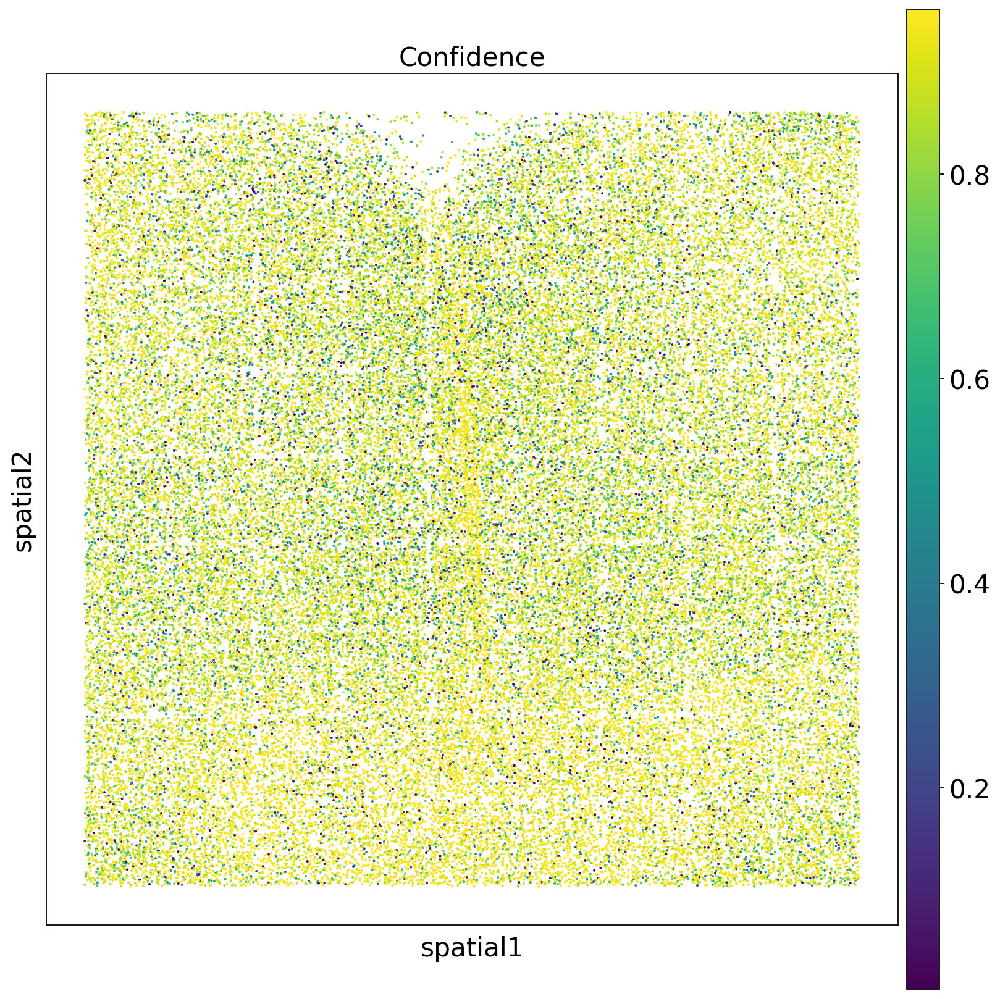

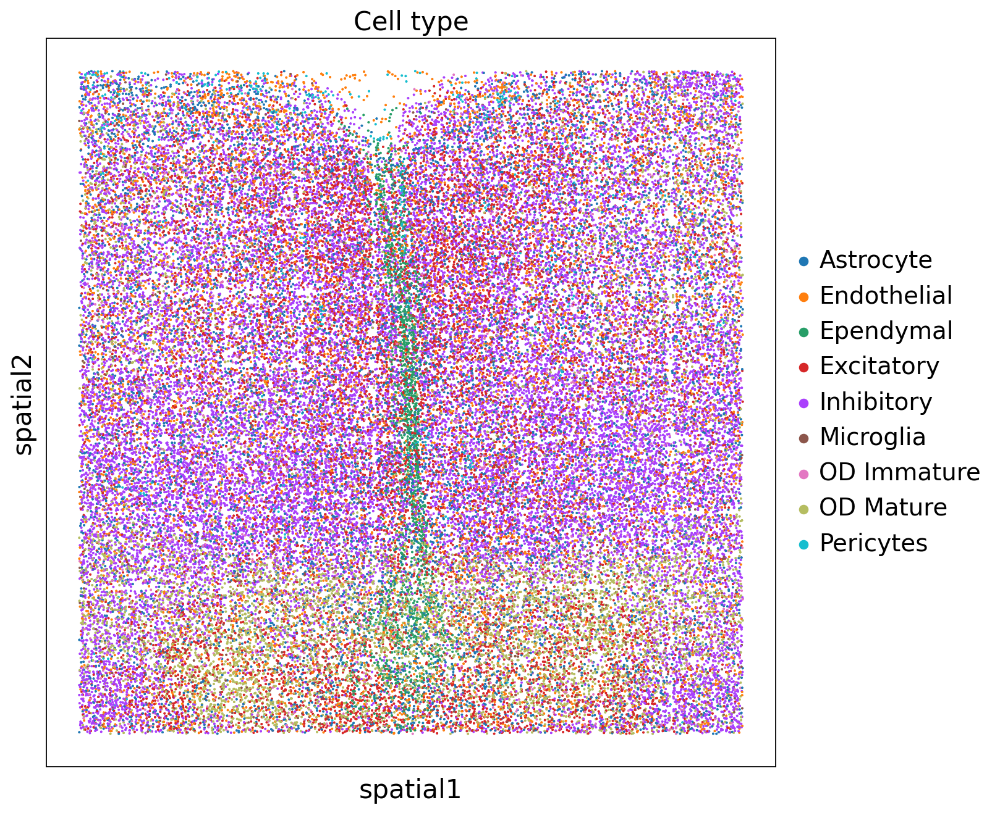

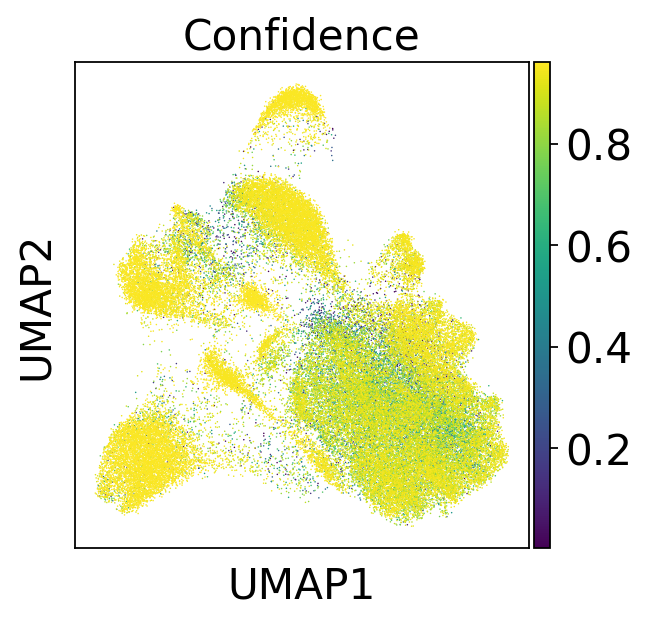

In [14]:
sq.pl.spatial_scatter(
    adata, color=['conf'], shape=None, figsize=(10, 10), title='Confidence',
)
sq.pl.spatial_scatter(
    adata, color=["CellType"], shape=None, figsize=(10, 10),   title='Cell type',
)
sc.pl.umap(adata,color=['conf'], title='Confidence')

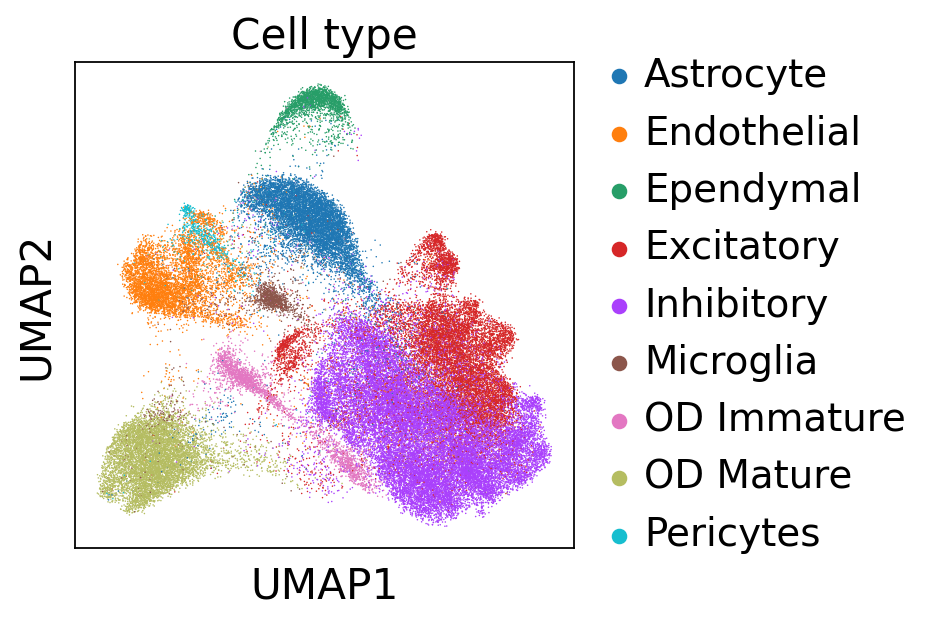

In [15]:
sc.pl.umap(adata,color=["CellType"],   title='Cell type')


/cs/labs/mornitzan/karinjo/miniconda/envs/rev17/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  after removing the cwd from sys.path.
/cs/labs/mornitzan/karinjo/miniconda/envs/rev17/lib/python3.7/site-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  import sys


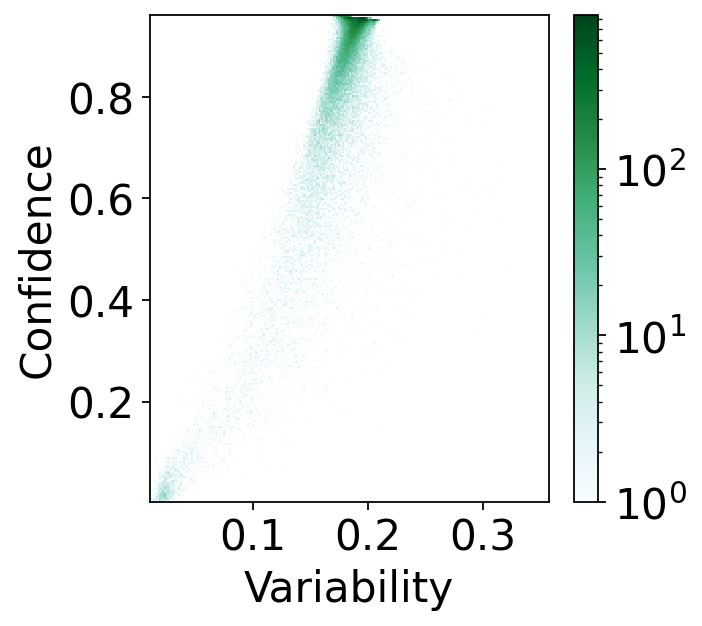

In [16]:
import matplotlib
plt.xlim([0,1])
plt.ylim([0,1])
plt.hist2d(adata.obs['var'], adata.obs['conf'], bins=250, cmap='BuGn',norm=matplotlib.colors.LogNorm())
plt.xlabel('Variability')
plt.ylabel('Confidence')
plt.colorbar()

In [17]:
adata.obs['conf_binaries'] = pd.Categorical((adata.obs['conf'] > cutoff_conf) | (adata.obs['var'] > cutoff_var))

adata.obs['conf_binaries'].value_counts()

True     63216
False     1157
Name: conf_binaries, dtype: int64

In [18]:

marker_genes_dict = {'Inhibitory neurons':['Gad1'],#, 'Gad2', 'Slc32a1'],
                     'Excitatory neurons': ['Slc17a6'],
                     'Pericytes':['Myh11'],
                     'Endothelial':['Fn1'],
                     'Ependymal':['Cd24a'],
                     'Microglia':['Selplg'],
                     'Astrocytes': ['Aqp4'],
                     'OD Immature': ['Pdgfra'],
                     'OD Mature':['Ttyh2','Mbp']}


marker_genes_list = ['Gad1','Slc17a6',
                     'Myh11',
                     'Fn1',
                     'Cd24a',
                     'Selplg',
                     'Aqp4',
                     'Pdgfra',
                     'Ttyh2','Mbp']



In [19]:
corr_classified_list =[]
for i in range(adata.n_obs):
    if adata.obs['conf_binaries'][i]==True:
        corr_classified_list.append('Correct annotation')
    else: 
        corr_classified_list.append('Erroneous annotation')
adata.obs['annotation']=corr_classified_list
bdata = adata.copy()

sc.pp.scale(bdata)


OD Mature


/cs/labs/mornitzan/karinjo/miniconda/envs/rev17/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
findfont: Font family ['Verdana'] not found. Falling back to DejaVu Sans.


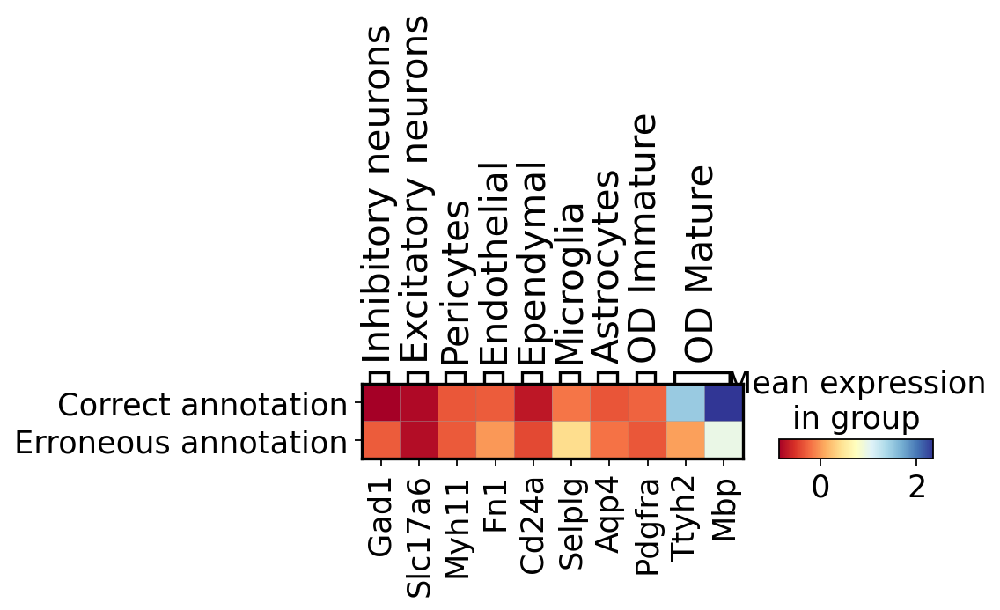

Correct annotation      7060
Erroneous annotation      34
Name: annotation, dtype: int64
OD Immature


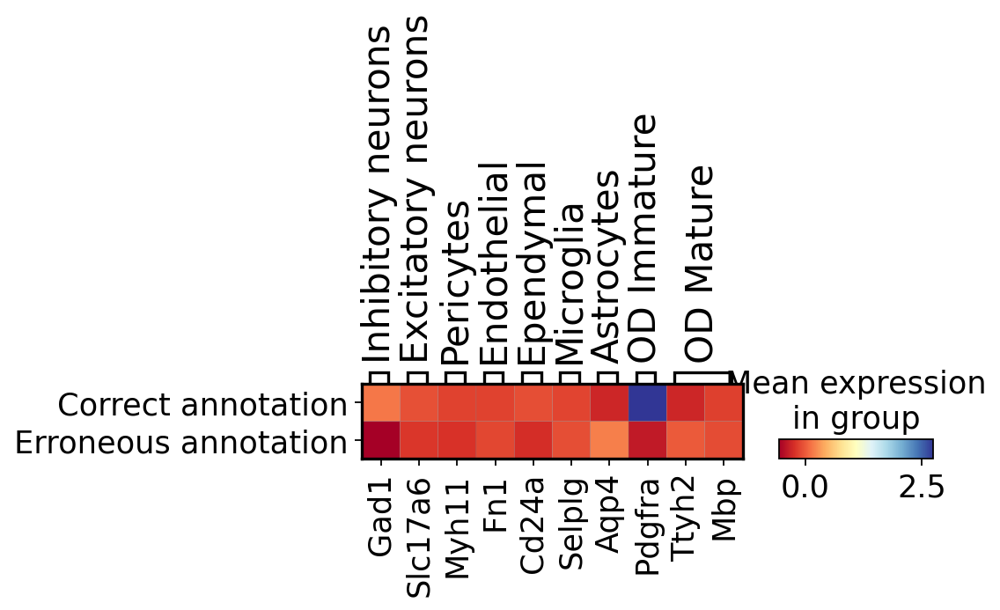

Correct annotation      2506
Erroneous annotation      42
Name: annotation, dtype: int64
Inhibitory


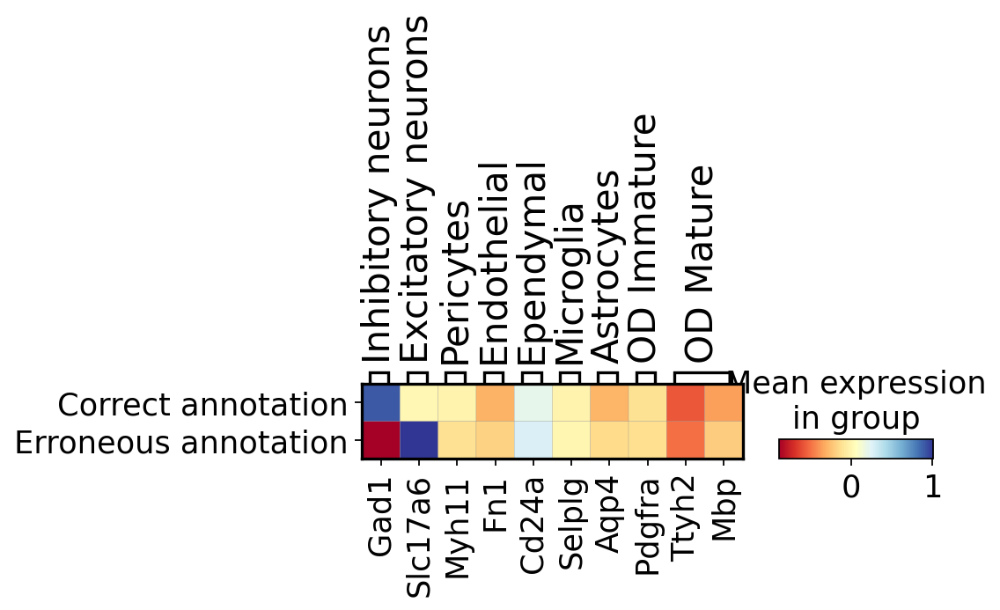

Correct annotation      24106
Erroneous annotation      655
Name: annotation, dtype: int64
Excitatory


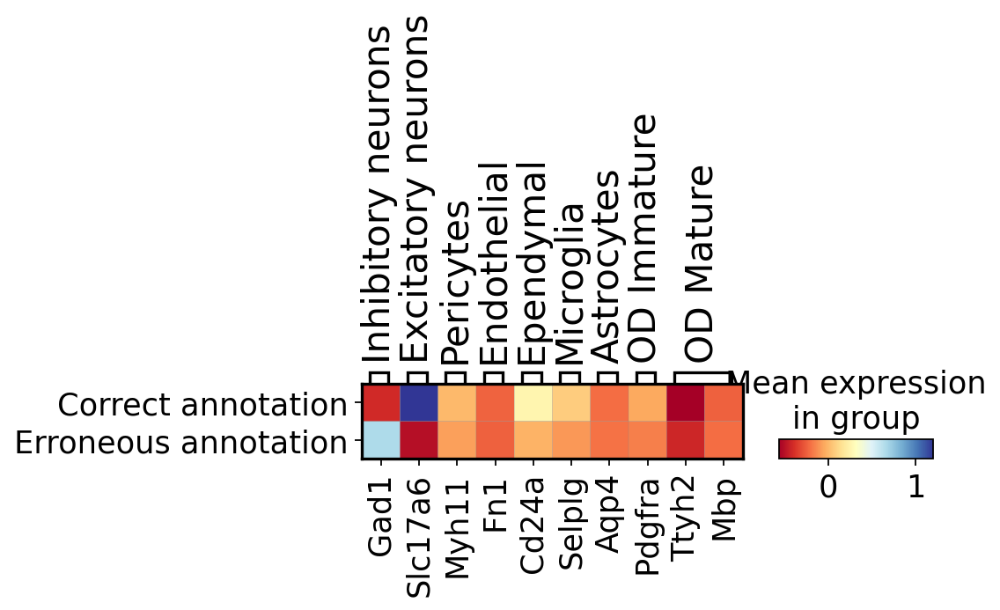

Correct annotation      11490
Erroneous annotation      267
Name: annotation, dtype: int64
Microglia


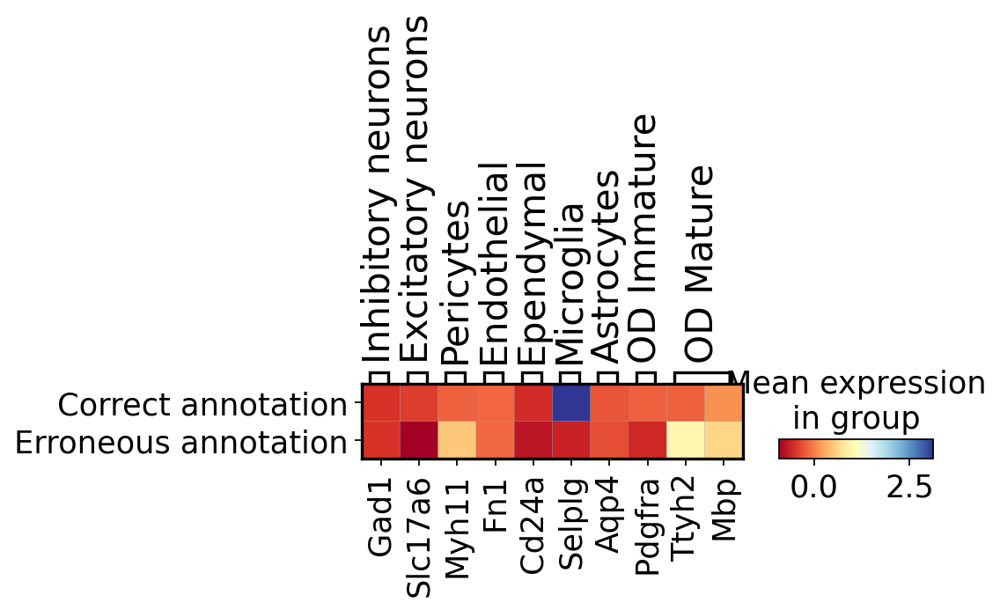

Correct annotation      1465
Erroneous annotation       7
Name: annotation, dtype: int64
Astrocyte


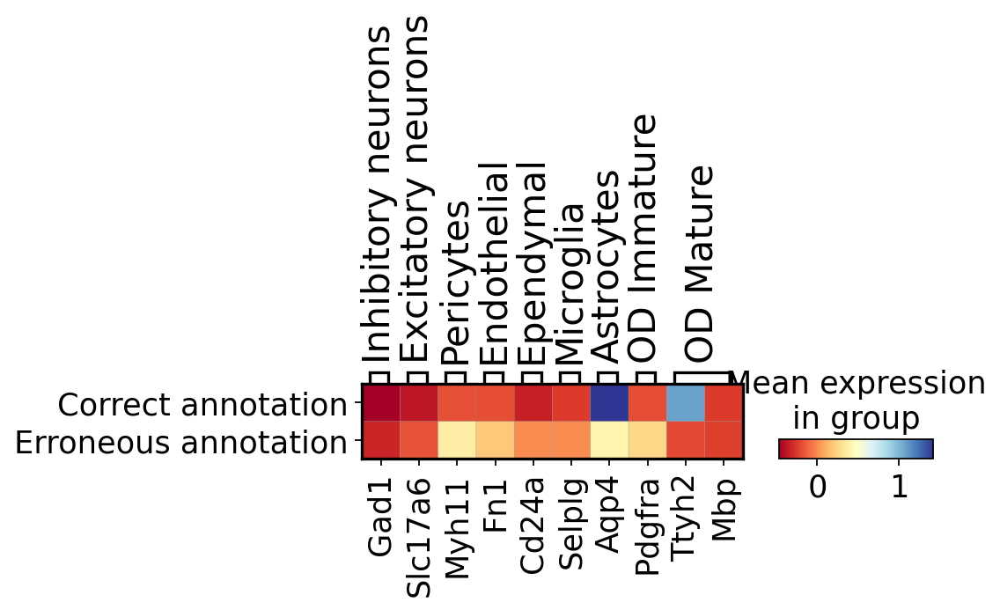

Correct annotation      8311
Erroneous annotation      82
Name: annotation, dtype: int64
Endothelial


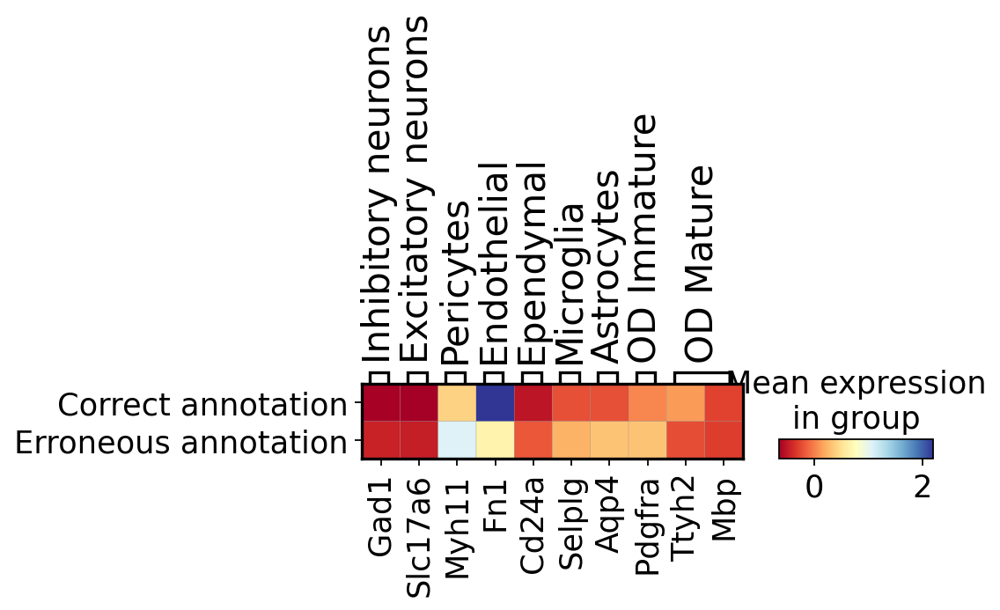

Correct annotation      5680
Erroneous annotation      69
Name: annotation, dtype: int64
Pericytes


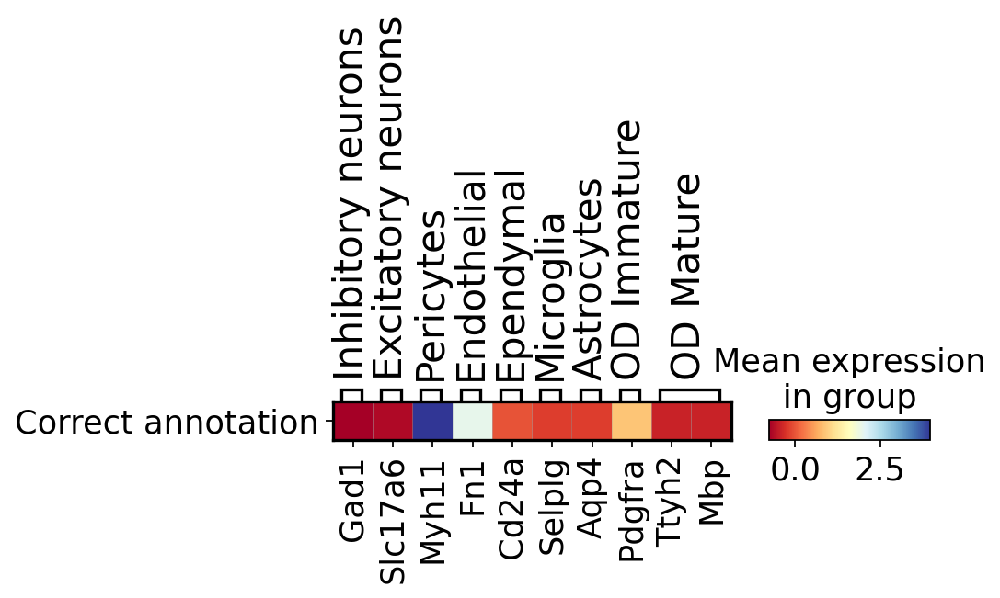

Correct annotation    638
Name: annotation, dtype: int64
Ependymal


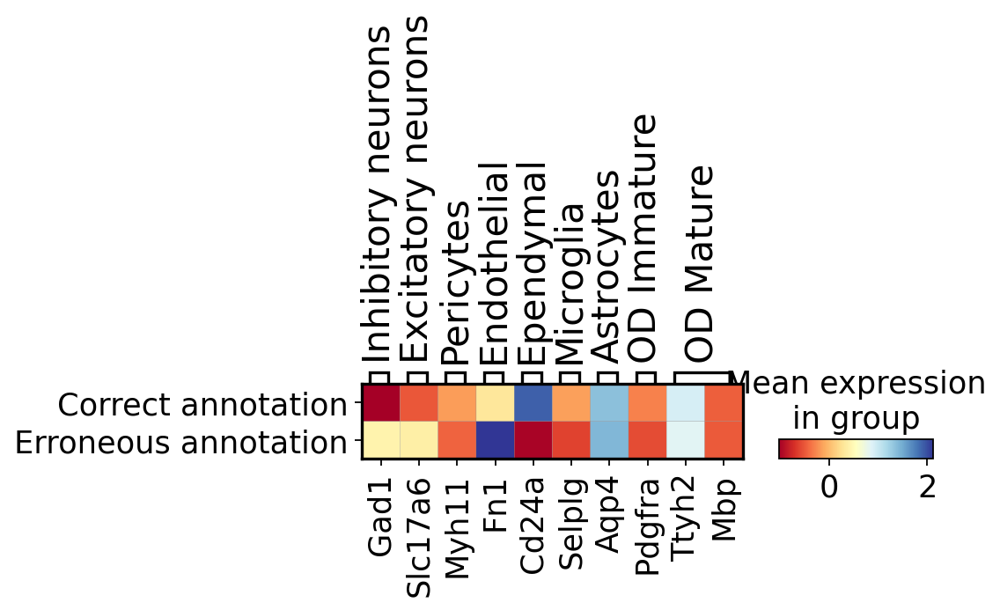

Correct annotation      1960
Erroneous annotation       1
Name: annotation, dtype: int64


In [20]:
celltype_list = adata.obs['CellType'].unique()
for celltype in celltype_list:
    print(celltype)
    adata_tmp= bdata[bdata.obs['CellType'].isin([celltype])]
    ax = sc.pl.matrixplot(adata_tmp, marker_genes_dict, groupby='annotation', cmap='RdYlBu')
    print(adata_tmp.obs['annotation'].value_counts())

In [21]:
bdata= adata[adata.obs['conf_binaries'].isin([True])]
cdata= bdata.copy()
sc.pp.scale(cdata)

In [22]:
hdata = models.predict_true_labels(adata, label='CellType', device=device, epoch_num=20)

/cs/labs/mornitzan/karinjo/training_dynamics/CellAnnotatability-main/models.py:51: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.log_softmax(x)


[1,     2] loss: 0.451
[1,    12] loss: 2.194
[1,    22] loss: 2.144
[1,    32] loss: 2.091
[1,    42] loss: 2.019
[1,    52] loss: 1.964
[1,    62] loss: 1.910
[1,    72] loss: 1.823
[1,    82] loss: 1.777
[1,    92] loss: 1.688
[1,   102] loss: 1.597
[1,   112] loss: 1.511
[1,   122] loss: 1.432
[1,   132] loss: 1.331
[1,   142] loss: 1.237
[1,   152] loss: 1.137
[1,   162] loss: 1.033
[1,   172] loss: 0.951
[1,   182] loss: 0.869
[1,   192] loss: 0.780
[1,   202] loss: 0.709
[1,   212] loss: 0.672
[1,   222] loss: 0.612
[1,   232] loss: 0.588
[1,   242] loss: 0.546
[2,     2] loss: 0.100
[2,    12] loss: 0.499
[2,    22] loss: 0.476
[2,    32] loss: 0.449
[2,    42] loss: 0.419
[2,    52] loss: 0.410
[2,    62] loss: 0.395
[2,    72] loss: 0.382
[2,    82] loss: 0.365
[2,    92] loss: 0.376
[2,   102] loss: 0.339
[2,   112] loss: 0.321
[2,   122] loss: 0.336
[2,   132] loss: 0.339
[2,   142] loss: 0.301
[2,   152] loss: 0.319
[2,   162] loss: 0.306
[2,   172] loss: 0.270
[2,   182] 

[15,   172] loss: 0.128
[15,   182] loss: 0.138
[15,   192] loss: 0.130
[15,   202] loss: 0.119
[15,   212] loss: 0.105
[15,   222] loss: 0.123
[15,   232] loss: 0.122
[15,   242] loss: 0.128
[16,     2] loss: 0.028
[16,    12] loss: 0.117
[16,    22] loss: 0.133
[16,    32] loss: 0.120
[16,    42] loss: 0.124
[16,    52] loss: 0.109
[16,    62] loss: 0.134
[16,    72] loss: 0.137
[16,    82] loss: 0.128
[16,    92] loss: 0.125
[16,   102] loss: 0.124
[16,   112] loss: 0.132
[16,   122] loss: 0.129
[16,   132] loss: 0.136
[16,   142] loss: 0.113
[16,   152] loss: 0.126
[16,   162] loss: 0.123
[16,   172] loss: 0.118
[16,   182] loss: 0.118
[16,   192] loss: 0.112
[16,   202] loss: 0.122
[16,   212] loss: 0.124
[16,   222] loss: 0.108
[16,   232] loss: 0.118
[16,   242] loss: 0.118
[17,     2] loss: 0.028
[17,    12] loss: 0.112
[17,    22] loss: 0.128
[17,    32] loss: 0.113
[17,    42] loss: 0.119
[17,    52] loss: 0.132
[17,    62] loss: 0.132
[17,    72] loss: 0.123
[17,    82] loss

In [23]:
hdata

AnnData object with n_obs × n_vars = 64373 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch', 'n_counts', 'CellType', 'var', 'conf', 'modified_label', 'conf_binaries', 'annotation', 'CorrectedCellType'
    uns: 'Cell_class_colors', 'log1p', 'pca', 'neighbors', 'umap', 'CellType_colors'
    obsm: 'spatial', 'spatial3d', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [24]:
adata_false_annotation= adata[adata.obs['conf_binaries'].isin([False])]

In [25]:
adata_true_annotation= adata[adata.obs['conf_binaries'].isin([True])]

In [26]:
hdata.obs['changed_anno'] = (hdata.obs['CellType']==hdata.obs['CorrectedCellType'])

In [27]:
adata_did_not_changed= hdata[hdata.obs['changed_anno'].isin([True])]
adata_did_not_changed = adata_did_not_changed[adata_did_not_changed.obs['conf_binaries'].isin([False])]
adata_did_not_changed

View of AnnData object with n_obs × n_vars = 0 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch', 'n_counts', 'CellType', 'var', 'conf', 'modified_label', 'conf_binaries', 'annotation', 'CorrectedCellType', 'changed_anno'
    uns: 'Cell_class_colors', 'log1p', 'pca', 'neighbors', 'umap', 'CellType_colors'
    obsm: 'spatial', 'spatial3d', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [28]:
adata_annotation_changed= hdata[hdata.obs['changed_anno'].isin([False])]

In [29]:
adata_annotation_changed

View of AnnData object with n_obs × n_vars = 1157 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch', 'n_counts', 'CellType', 'var', 'conf', 'modified_label', 'conf_binaries', 'annotation', 'CorrectedCellType', 'changed_anno'
    uns: 'Cell_class_colors', 'log1p', 'pca', 'neighbors', 'umap', 'CellType_colors'
    obsm: 'spatial', 'spatial3d', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

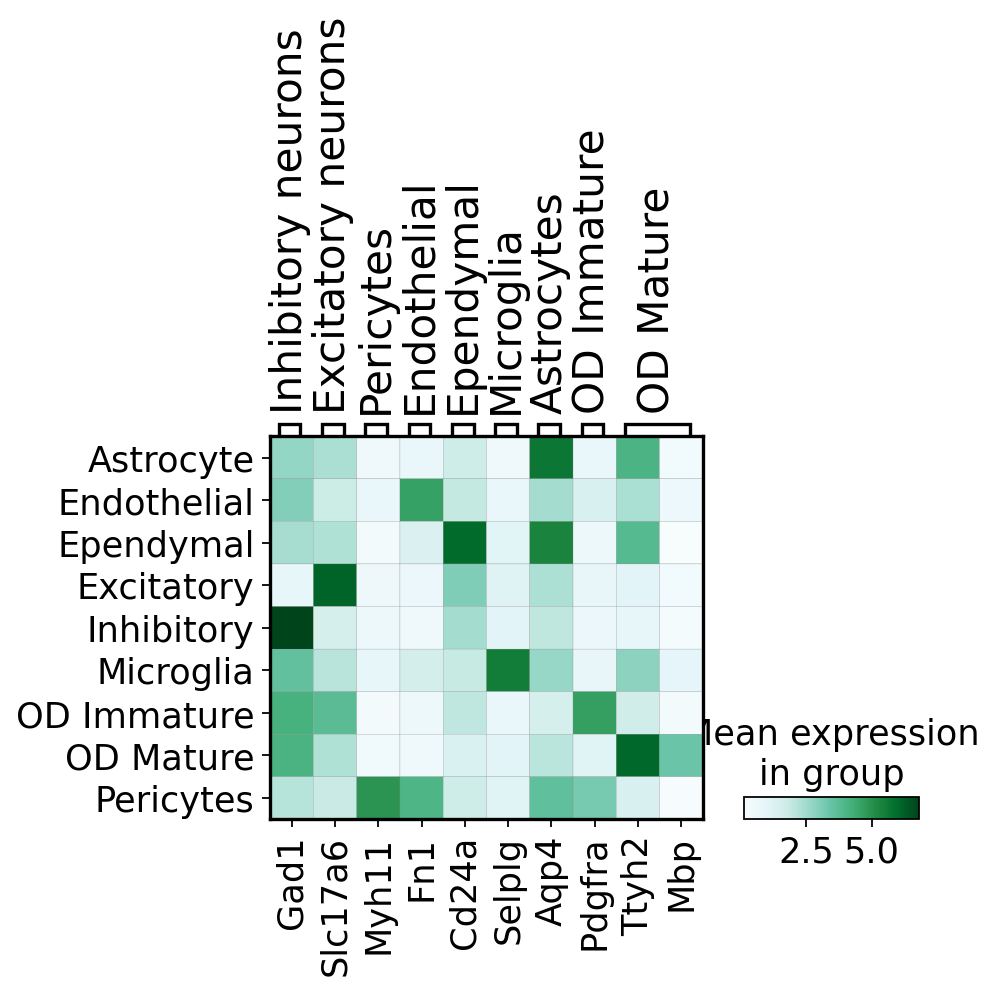

In [30]:
adata_annotation_changed_scaled = adata_annotation_changed.copy()
ax = sc.pl.matrixplot(adata_annotation_changed_scaled, marker_genes_dict, groupby='CorrectedCellType', cmap='BuGn')


/cs/labs/mornitzan/karinjo/miniconda/envs/rev17/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


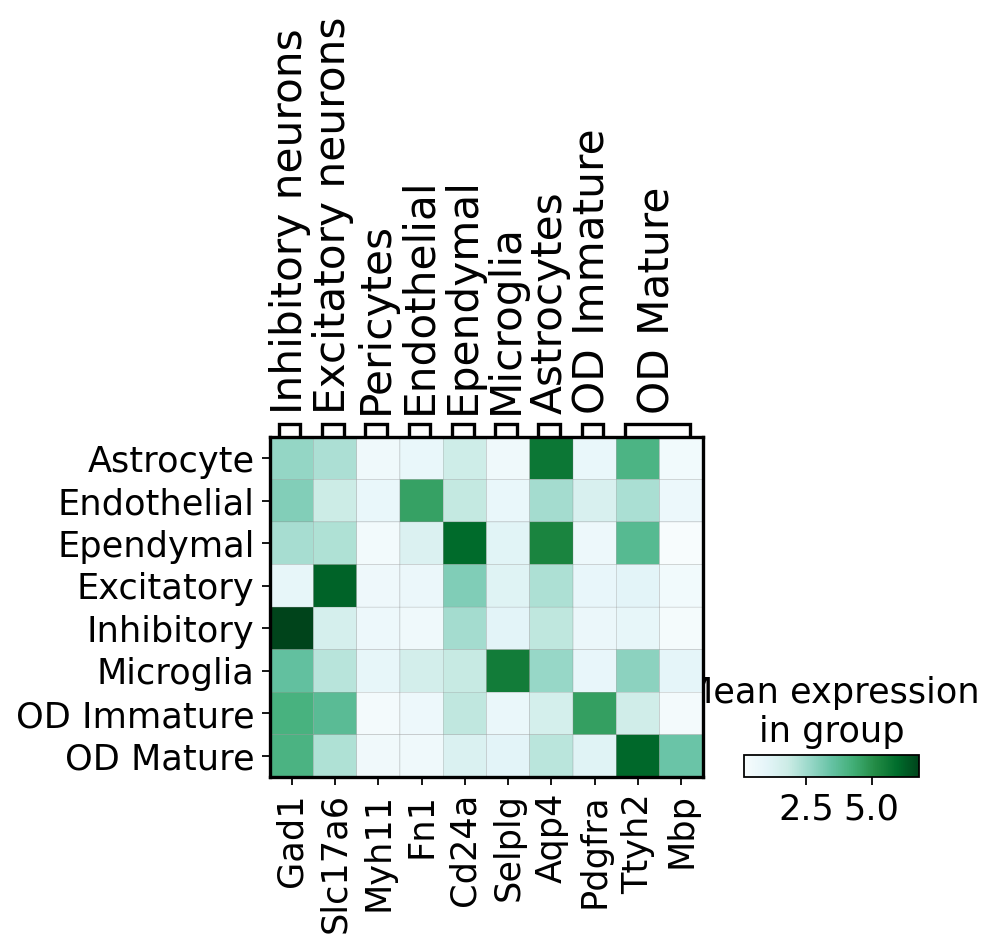

In [31]:
adata_annotation_changed_no_per= adata_annotation_changed[adata_annotation_changed.obs['CorrectedCellType'].isin(['Astrocyte',
                                            'Endothelial', 'Ependymal',
                                            'Excitatory',
                                            'Inhibitory', 'Microglia', 'OD Immature',
                                                                                                         'OD Mature'])]
ax = sc.pl.matrixplot(adata_annotation_changed_no_per, marker_genes_dict, groupby='CorrectedCellType', cmap='BuGn')


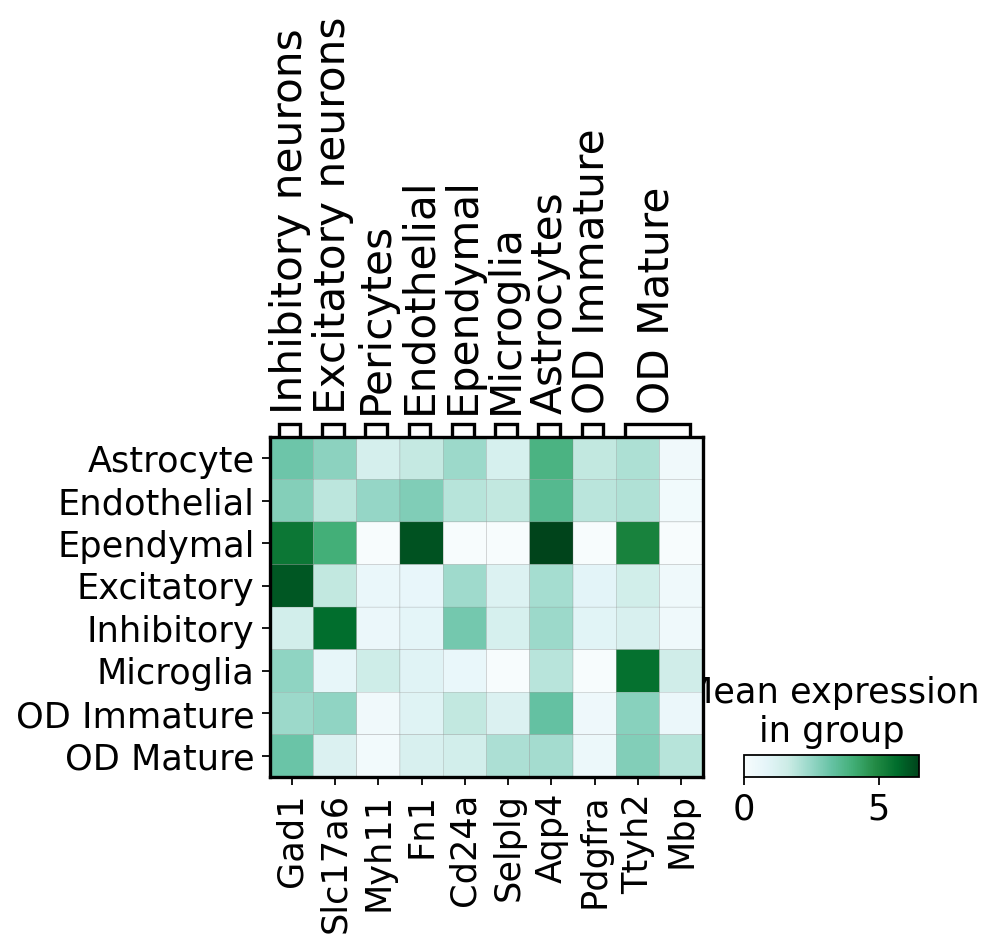

In [32]:
adata_false_annotated= hdata[hdata.obs['conf_binaries'].isin([False])]
ax = sc.pl.matrixplot(adata_false_annotated, marker_genes_dict, groupby='CellType', cmap='BuGn')


/cs/labs/mornitzan/karinjo/miniconda/envs/rev17/lib/python3.7/site-packages/ipykernel_launcher.py:9: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  if __name__ == "__main__":
/cs/labs/mornitzan/karinjo/miniconda/envs/rev17/lib/python3.7/site-packages/ipykernel_launcher.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/cs/labs/mornitzan/karinjo/miniconda/envs/rev17/lib/python3.7/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


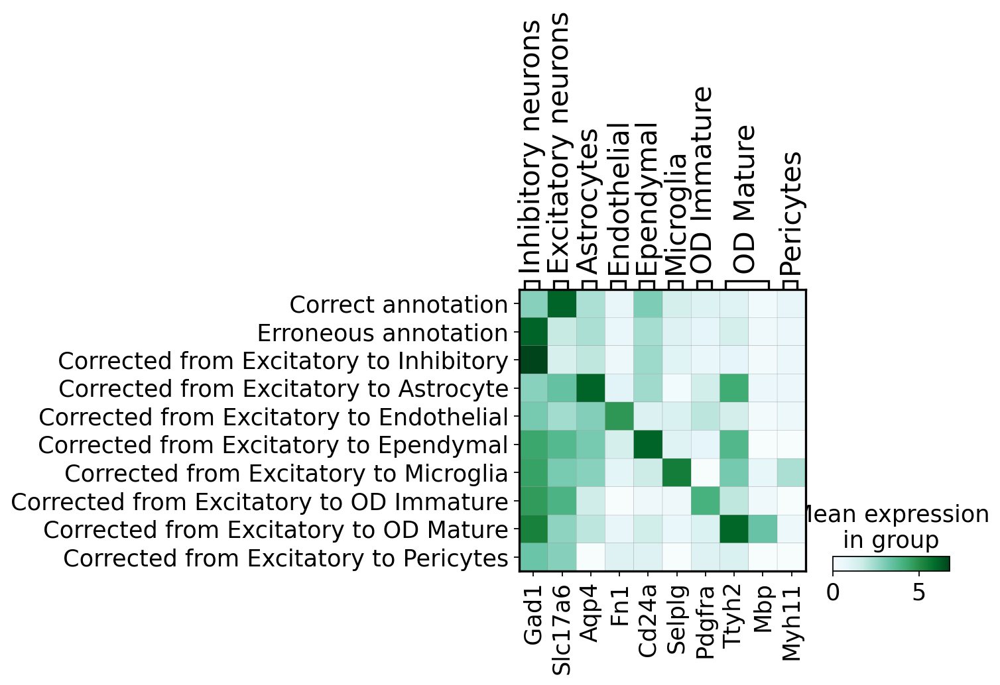

In [33]:
tmp_tdata2 = hdata[hdata.obs['CellType'].isin(['Excitatory'])]
False_or_pos = []
for i in range(tmp_tdata2.n_obs):
    if tmp_tdata2.obs['conf_binaries'][i]:
        False_or_pos.append('  Correct annotation')
    else:
        False_or_pos.append('  Erroneous annotation')

tmp_tdata2.obs['Celltype_to_corrected'] = False_or_pos


Celltype_to_corrected =[]
for i in range(adata_false_annotated.n_obs):
    if adata_false_annotated.obs['CorrectedCellType'][i]=='Inhibitory':
        string = " " +str(adata_false_annotated.obs['CellType'][i]) + "_" + str(adata_false_annotated.obs['CorrectedCellType'][i])
    elif adata_false_annotated.obs['CorrectedCellType'][i]=='Excitatory':
        string = " " +str(adata_false_annotated.obs['CellType'][i]) + "_" + str(adata_false_annotated.obs['CorrectedCellType'][i])
    else:
        string = str(adata_false_annotated.obs['CellType'][i]) + "_" + str(adata_false_annotated.obs['CorrectedCellType'][i])
    Celltype_to_corrected.append(string)
adata_false_annotated.obs['Celltype_to_corrected'] = Celltype_to_corrected

tmp_tdata = adata_false_annotated[adata_false_annotated.obs['CellType'].isin(['Excitatory'])]
Celltype_to_corrected =[]
for i in range(tmp_tdata.n_obs):
        if tmp_tdata.obs['conf_binaries'][i]==False:        
            if tmp_tdata.obs['CorrectedCellType'][i]=='Inhibitory': 
                string = " Corrected from " + str(tmp_tdata.obs['CellType'][i]) + " to " + str(tmp_tdata.obs['CorrectedCellType'][i])
            elif tmp_tdata.obs['CorrectedCellType'][i]=='Excitatory': 
                string = " Corrected from " + str(tmp_tdata.obs['CellType'][i]) + " to " + str(tmp_tdata.obs['CorrectedCellType'][i])
            else:
                string = "Corrected from " + str(tmp_tdata.obs['CellType'][i]) + " to " + str(tmp_tdata.obs['CorrectedCellType'][i])
            Celltype_to_corrected.append(string)

tmp_tdata.obs['Celltype_to_corrected'] = Celltype_to_corrected

marker_genes_dict = {
                     'Inhibitory neurons':['Gad1'],#, 'Gad2', 'Slc32a1'],
                    'Excitatory neurons': ['Slc17a6'],
                     'Astrocytes': ['Aqp4'],
                     'Endothelial':['Fn1'],
                     'Ependymal':['Cd24a'],
                     'Microglia':['Selplg'],
                     'OD Immature': ['Pdgfra'],
                     'OD Mature':['Ttyh2','Mbp'],
                     'Pericytes':['Myh11']}


tmp_tdata3 = tmp_tdata2.concatenate(tmp_tdata)




ax = sc.pl.matrixplot(tmp_tdata3, marker_genes_dict, groupby='Celltype_to_corrected', cmap='BuGn')


In [34]:
tmp_tdata.obs['CorrectedCellType'].value_counts()

Inhibitory     204
Astrocyte       18
OD Mature       11
Microglia       10
Endothelial      8
OD Immature      8
Ependymal        4
Pericytes        4
Name: CorrectedCellType, dtype: int64

/cs/labs/mornitzan/karinjo/miniconda/envs/rev17/lib/python3.7/site-packages/ipykernel_launcher.py:9: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  if __name__ == "__main__":
/cs/labs/mornitzan/karinjo/miniconda/envs/rev17/lib/python3.7/site-packages/ipykernel_launcher.py:30: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/cs/labs/mornitzan/karinjo/miniconda/envs/rev17/lib/python3.7/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


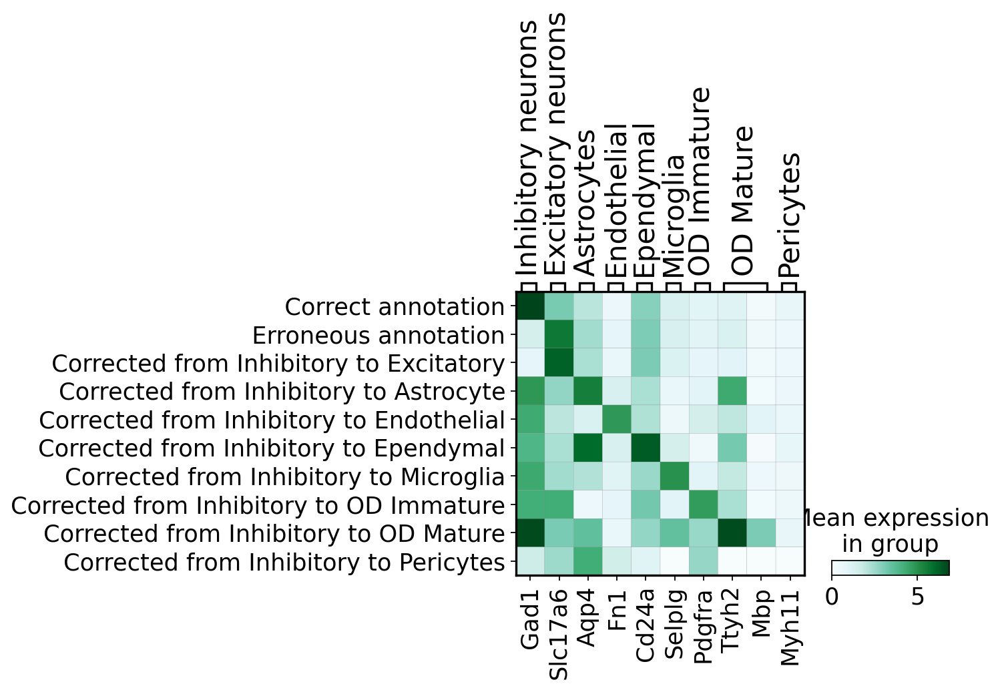

In [35]:
tmp_tdata2 = hdata[hdata.obs['CellType'].isin(['Inhibitory'])]
False_or_pos = []
for i in range(tmp_tdata2.n_obs):
    if tmp_tdata2.obs['conf_binaries'][i]:
        False_or_pos.append('  Correct annotation')
    else:
        False_or_pos.append('  Erroneous annotation')

tmp_tdata2.obs['Celltype_to_corrected'] = False_or_pos


Celltype_to_corrected =[]
for i in range(adata_false_annotated.n_obs):
    string = str(adata_false_annotated.obs['CellType'][i]) + "_" + str(adata_false_annotated.obs['CorrectedCellType'][i])
    Celltype_to_corrected.append(string)
adata_false_annotated.obs['Celltype_to_corrected'] = Celltype_to_corrected

tmp_tdata = adata_false_annotated[adata_false_annotated.obs['CellType'].isin(['Inhibitory'])]
Celltype_to_corrected =[]
for i in range(tmp_tdata.n_obs):
        if tmp_tdata.obs['conf_binaries'][i]==False:        
            if tmp_tdata.obs['CorrectedCellType'][i]=='Inhibitory': 
                string = " Corrected from " + str(tmp_tdata.obs['CellType'][i]) + " to " + str(tmp_tdata.obs['CorrectedCellType'][i])
            elif tmp_tdata.obs['CorrectedCellType'][i]=='Excitatory': 
                string = " Corrected from " + str(tmp_tdata.obs['CellType'][i]) + " to " + str(tmp_tdata.obs['CorrectedCellType'][i])
            else:
                string = "Corrected from " + str(tmp_tdata.obs['CellType'][i]) + " to " + str(tmp_tdata.obs['CorrectedCellType'][i])
            Celltype_to_corrected.append(string)

tmp_tdata.obs['Celltype_to_corrected'] = Celltype_to_corrected

marker_genes_dict = {
                     'Inhibitory neurons':['Gad1'],#, 'Gad2', 'Slc32a1'],
                    'Excitatory neurons': ['Slc17a6'],
                     'Astrocytes': ['Aqp4'],
                     'Endothelial':['Fn1'],
                     'Ependymal':['Cd24a'],
                     'Microglia':['Selplg'],
                     'OD Immature': ['Pdgfra'],
                     'OD Mature':['Ttyh2','Mbp'],
                     'Pericytes':['Myh11']}


tmp_tdata3 = tmp_tdata2.concatenate(tmp_tdata)



ax = sc.pl.matrixplot(tmp_tdata3, marker_genes_dict, groupby='Celltype_to_corrected', cmap='BuGn')


In [36]:
tmp_tdata.obs['CorrectedCellType'].value_counts()

Excitatory     544
Microglia       28
Astrocyte       25
Endothelial     20
OD Immature     18
Ependymal       12
OD Mature        4
Pericytes        4
Name: CorrectedCellType, dtype: int64

In [37]:
adata_annotation_changed

View of AnnData object with n_obs × n_vars = 1157 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch', 'n_counts', 'CellType', 'var', 'conf', 'modified_label', 'conf_binaries', 'annotation', 'CorrectedCellType', 'changed_anno'
    uns: 'Cell_class_colors', 'log1p', 'pca', 'neighbors', 'umap', 'CellType_colors'
    obsm: 'spatial', 'spatial3d', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [38]:
def print_all_mean_expressions(adata,genes_list,label):
    annotations_list = adata.obs[label].unique()
    for gene in genes_list:
        for annotation in annotations_list:
            print("Mean expression of " + gene +" in " + annotation)
            print(get_mean_expression(adata, gene, label,annotation))
def get_mean_expression(adata, gene, label,annotation):
    adata_tmp = (adata[adata.obs[label].isin([annotation])])
    mean_expression = float(np.mean(adata_tmp[:, gene].X.toarray()))
    return mean_expression


In [39]:
print_all_mean_expressions(adata_annotation_changed,marker_genes_list,'CorrectedCellType')

Mean expression of Gad1 in Microglia
3.5376455783843994
Mean expression of Gad1 in Inhibitory
6.8170647621154785
Mean expression of Gad1 in Excitatory
0.8797268867492676
Mean expression of Gad1 in Astrocyte
2.70947003364563
Mean expression of Gad1 in OD Immature
4.130979061126709
Mean expression of Gad1 in Endothelial
2.9948649406433105
Mean expression of Gad1 in Pericytes
2.1231017112731934
Mean expression of Gad1 in Ependymal
2.396685838699341
Mean expression of Gad1 in OD Mature
4.072113513946533
Mean expression of Slc17a6 in Microglia
2.110814332962036
Mean expression of Slc17a6 in Inhibitory
1.4774500131607056
Mean expression of Slc17a6 in Excitatory
6.186601161956787
Mean expression of Slc17a6 in Astrocyte
2.328238010406494
Mean expression of Slc17a6 in OD Immature
3.7308902740478516
Mean expression of Slc17a6 in Endothelial
1.7986797094345093
Mean expression of Slc17a6 in Pericytes
1.8045357465744019
Mean expression of Slc17a6 in Ependymal
2.273515462875366
Mean expression of Sl

In [40]:
print_all_mean_expressions(adata_false_annotation,marker_genes_list,'CellType')

Mean expression of Gad1 in Inhibitory
1.426409125328064
Mean expression of Gad1 in Excitatory
6.109755992889404
Mean expression of Gad1 in Astrocyte
3.1227521896362305
Mean expression of Gad1 in Endothelial
2.7814736366271973
Mean expression of Gad1 in OD Mature
3.189094066619873
Mean expression of Gad1 in OD Immature
2.3940236568450928
Mean expression of Gad1 in Microglia
2.6078360080718994
Mean expression of Gad1 in Ependymal
5.402202129364014
Mean expression of Slc17a6 in Inhibitory
5.63586950302124
Mean expression of Slc17a6 in Excitatory
1.778564691543579
Mean expression of Slc17a6 in Astrocyte
2.640010118484497
Mean expression of Slc17a6 in Endothelial
1.8865718841552734
Mean expression of Slc17a6 in OD Mature
1.145585060119629
Mean expression of Slc17a6 in OD Immature
2.5738887786865234
Mean expression of Slc17a6 in Microglia
0.7452133297920227
Mean expression of Slc17a6 in Ependymal
4.029361724853516
Mean expression of Myh11 in Inhibitory
0.5341134071350098
Mean expression of M

In [41]:
print_all_mean_expressions(adata_true_annotation,marker_genes_list,'CellType')

Mean expression of Gad1 in OD Mature
1.5040754079818726
Mean expression of Gad1 in OD Immature
4.54670524597168
Mean expression of Gad1 in Inhibitory
6.84673547744751
Mean expression of Gad1 in Excitatory
2.852222442626953
Mean expression of Gad1 in Microglia
2.58232045173645
Mean expression of Gad1 in Astrocyte
2.678388833999634
Mean expression of Gad1 in Endothelial
2.179918050765991
Mean expression of Gad1 in Pericytes
1.7570804357528687
Mean expression of Gad1 in Ependymal
0.9750599265098572
Mean expression of Slc17a6 in OD Mature
1.0722235441207886
Mean expression of Slc17a6 in OD Immature
2.933454990386963
Mean expression of Slc17a6 in Inhibitory
3.1049129962921143
Mean expression of Slc17a6 in Excitatory
6.118091583251953
Mean expression of Slc17a6 in Microglia
2.0046961307525635
Mean expression of Slc17a6 in Astrocyte
2.124753952026367
Mean expression of Slc17a6 in Endothelial
1.4291777610778809
Mean expression of Slc17a6 in Pericytes
1.3610037565231323
Mean expression of Slc17

In [ ]:
hdata

In [44]:
orig_hdata = hdata.copy()
for col in hdata.obs.columns:
    if hdata.obs[col].dtype != 'object':
        hdata.obs[col] = hdata.obs[col].astype(str)

# Now you can write the AnnData object to disk

hdata.write("fig3_adata_corrected_celltype.h5ad")

In [45]:
orig_adata = adata.copy()
for col in adata.obs.columns:
    if adata.obs[col].dtype != 'object':
        adata.obs[col] = adata.obs[col].astype(str)

# Now you can write the AnnData object to disk
adata.write("fig3_adata.h5ad")